In [2]:
import sys
sys.path.append('../')
from torch.utils.data import DataLoader
import pytorch_lightning as pl
from nuscenes.nuscenes import NuScenes
import numpy as np
from src.utils import vox_utils, data_utils, geom_utils
import hydra
from omegaconf import DictConfig
import matplotlib.pyplot as plt
from src.datamodules.nuscenes_dataset import NuscData, VizData
from src.datamodules.nuscenes_datamodule import NuScenesDataModule


hydra.initialize(config_path="../configs/datamodule")
cfg = hydra.compose(config_name="nuscenes")
# Initialize the NuScenesDataModule with Hydra config
data_module = NuScenesDataModule(
    datasets=cfg.datasets, 
    transforms=cfg.transforms, 
    loaders=cfg.loaders
)

# Prepare data and setup the datamodule
data_module.prepare_data()
data_module.setup(stage='fit')

# Get the train dataloader
train_loader = data_module.train_dataloader()

# Get a batch from the dataloader
batch = next(iter(train_loader))

/data/karthik/bev_perception/notebooks/../src/datamodules/nuscenes_datamodule.py:70: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  @hydra.main(config_path="/data/karthik/bev_perception/configs/datamodule", config_name="nuscenes")
/tmp/ipykernel_1475529/1459343101.py:15: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  hydra.initialize(config_path="../configs/datamodule")


indices (323, 1)
indices (81, 1)


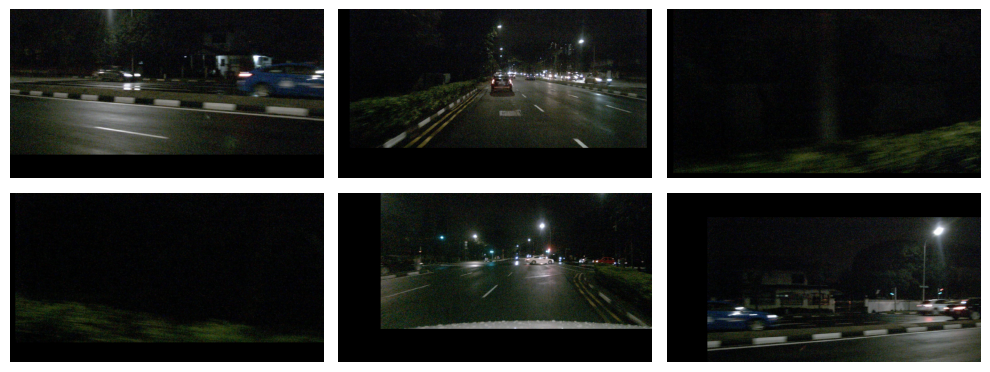

In [3]:
# Assuming the batch contains images as the first element
images = batch[0].squeeze(1)  # Adjust this depending on how the data is returned by the dataloader

# Plot 6 multiple view images


for j in range(1):
    fig, axes = plt.subplots(2, 3, figsize=(10, 4))
    axes = axes.flatten()
    for i in range(6):
        img = images[0, i].permute(1, 2, 0).cpu().numpy()  # Convert to HWC format
        axes[i].imshow(img)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

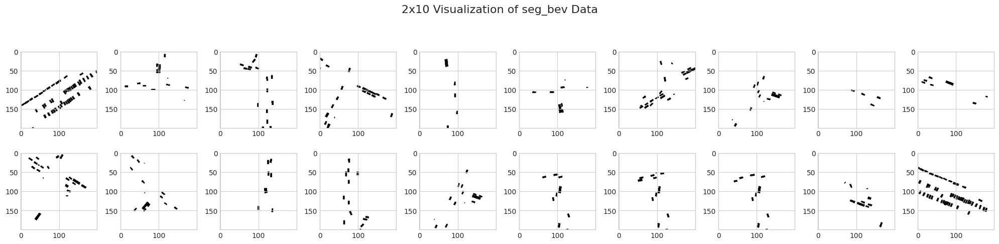

In [13]:
fig, axes = plt.subplots(2, 10, figsize=(20, 5))
fig.suptitle('2x10 Visualization of seg_bev Data', fontsize=16)
#seg_bev = batch[12].squeeze(1)[row*10+col].permute(1, 2, 0).numpy()
for row in range(2):
    for col in range(10):
        ax = axes[row, col]
        ax.imshow(batch[13].squeeze(1)[row*10+col].permute(1, 2, 0).numpy())
        #ax.axis('off')  # Turn off axis for a cleaner look

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
plt.show()

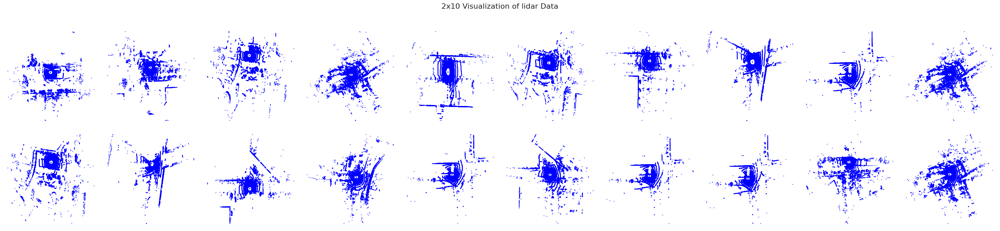

In [9]:
fig, axes = plt.subplots(2, 10, figsize=(30, 7))
fig.suptitle('2x10 Visualization of lidar Data', fontsize=16)
#seg_bev = batch[12].squeeze(1)[row*10+col].permute(1, 2, 0).numpy()
for row in range(2):
    for col in range(10):
        ax = axes[row, col]
        lidar_points = batch[7].squeeze(1)[row*10+col].T.numpy()
        ax.scatter(lidar_points[:, 0], lidar_points[:, 1], c='blue', s=1, alpha=0.5)
        ax.axis('off')  # Turn off axis for a cleaner look

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
plt.show()

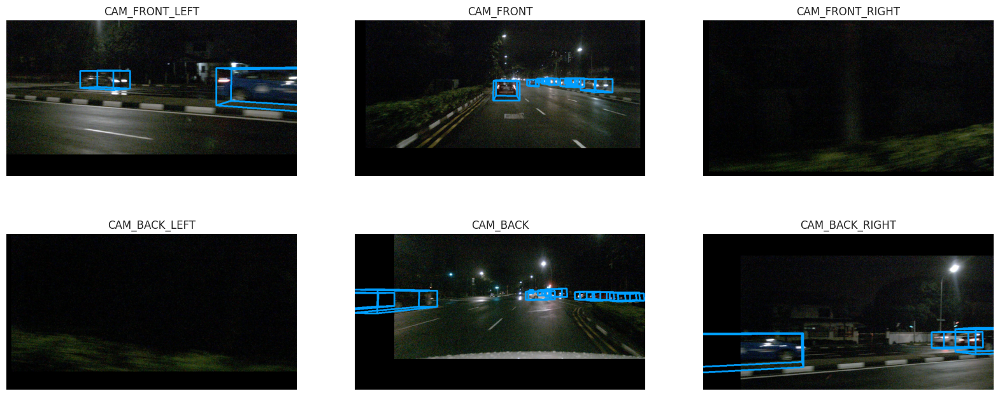

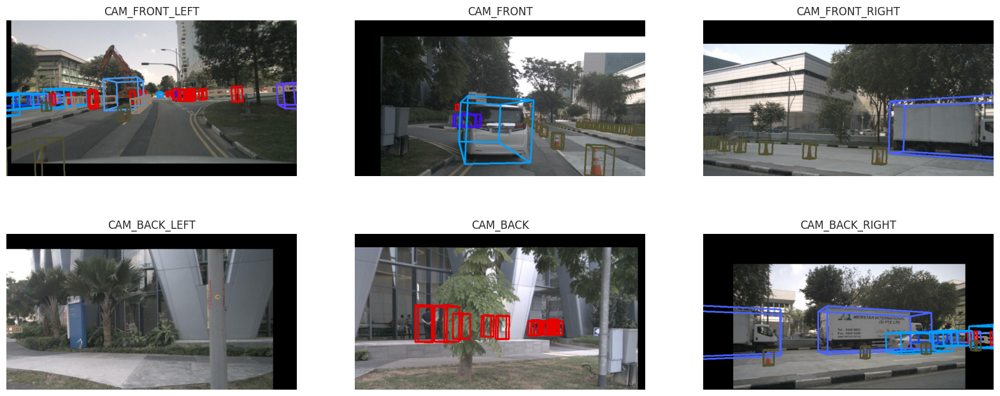

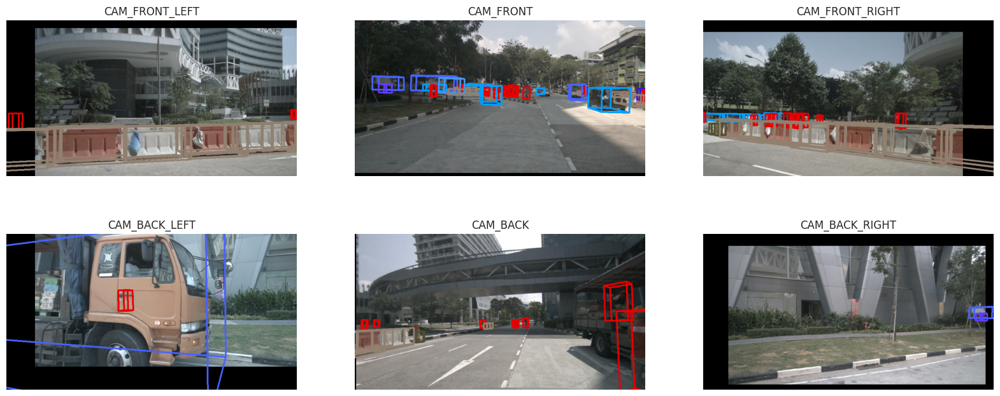

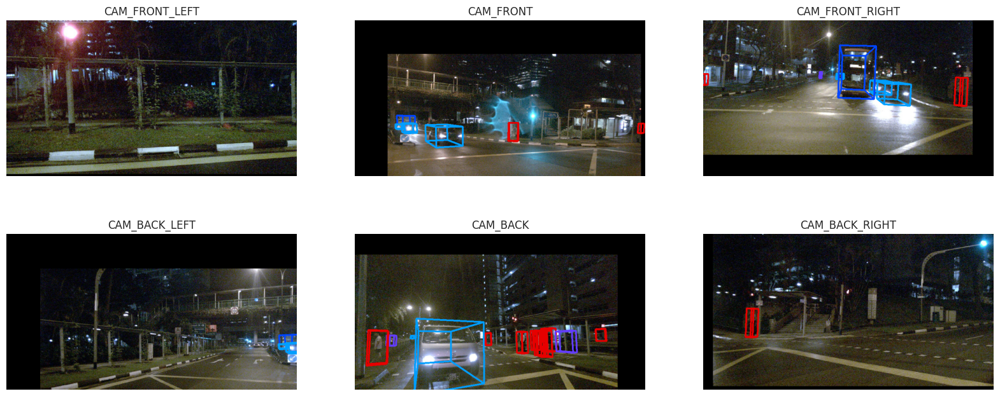

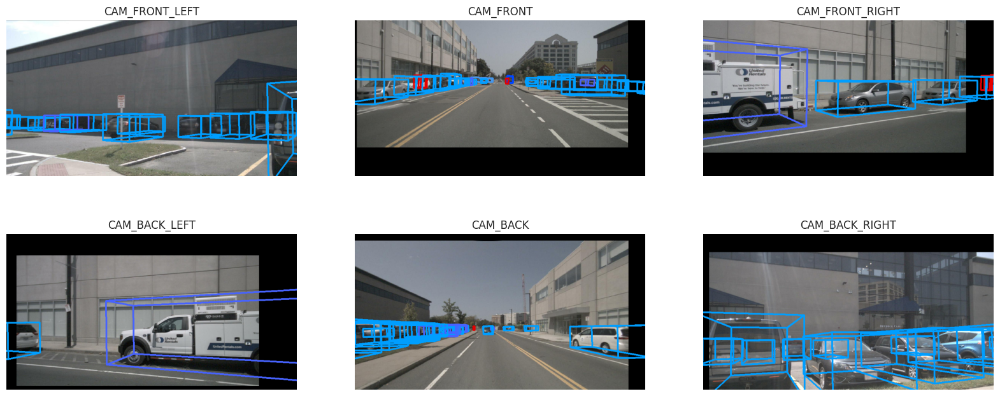

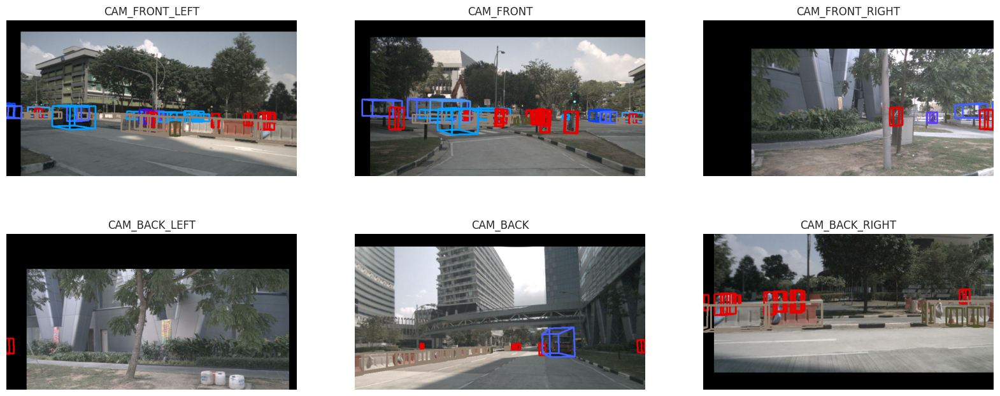

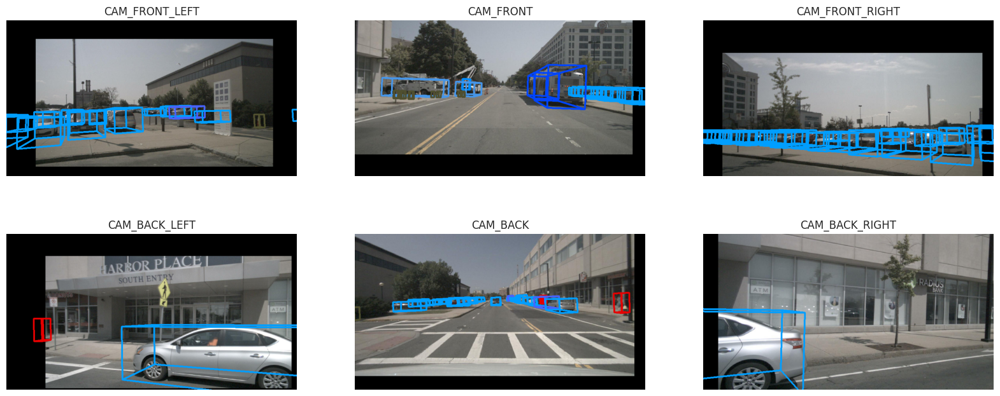

In [ ]:

import cv2

OBJECT_PALETTE = {
    "car": (255, 158, 0),
    "truck": (255, 99, 71),
    "construction_vehicle": (233, 150, 70),
    "bus": (255, 69, 0),
    "trailer": (255, 140, 0),
    "barrier": (112, 128, 144),
    "motorcycle": (255, 61, 99),
    "bicycle": (220, 20, 60),
    "pedestrian": (0, 0, 230),
    "traffic_cone": (47, 79, 79),
}


for j in range(7):
    lrtlist = batch[4][:,0][j]
    rots = batch[1][:,0][j]
    trans = batch[2][:,0][j]
    intrincs = batch[3][:,0][j]
    velo_T_cam = geom_utils.merge_rt(rots, trans)
    cam_T_velo = geom_utils.safe_inverse(velo_T_cam)
    labels = batch[10][:,0][j]
    fig, axes = plt.subplots(2, 3, figsize=(20, 8))
    axes = axes.flatten()
    cam_names = data_module.train_dataset.data_aug_conf['cams']
    for i in range(6):
        img = images[j, i].permute(1, 2, 0).cpu().numpy()
        canvas = img.copy()
        canvas = cv2.cvtColor(canvas, cv2.COLOR_RGB2BGR)
        #plt.imshow(canvas)
        #plt.show()
        axes[i].set_title(cam_names[i])
        intrincs_curr = intrincs[i].numpy()
        lrtlist_cam = geom_utils.apply_4x4_to_lrt(cam_T_velo[i:i+1].repeat(150, 1,1), lrtlist)
        corners_cam = geom_utils.get_xyzlist_from_lrtlist(lrtlist_cam.unsqueeze(0)).squeeze(0)
        num_bboxes = corners_cam.shape[0]
        coords = np.concatenate(
                [corners_cam.reshape(-1, 3), np.ones((num_bboxes * 8, 1))], axis=-1
            )
        coords = (intrincs_curr @ coords.T).T
        coords = coords.reshape(-1, 8, 4)
        indices = np.all(coords[..., 2] > 0, axis=1)
        coords = coords[indices]
        label = labels[indices]

        indices = np.argsort(-np.min(coords[..., 2], axis=1))
        coords = coords[indices]
        label = label[indices]

        coords = coords.reshape(-1, 4)
        coords[:, 2] = np.clip(coords[:, 2], a_min=1e-5, a_max=1e5)
        coords[:, 0] /= coords[:, 2]
        coords[:, 1] /= coords[:, 2]
        coords = coords[..., :2].reshape(-1, 8, 2)
        #print(coords)
        for index in range(coords.shape[0]):
            name = data_module.train_dataset.CLASSES[int(label[index])]
            for start, end in [
                (0, 1),
                (0, 3),
                (0, 4),
                (1, 2),
                (1, 5),
                (3, 2),
                (3, 7),
                (4, 5),
                (4, 7),
                (2, 6),
                (5, 6),
                (6, 7),
            ]:
                c = tuple(np.array(OBJECT_PALETTE[name]) / 255.0)
                cv2.line(
                    canvas,
                    coords[index, start].astype(np.int32),
                    coords[index, end].astype(np.int32),
                    c,
                    4,
                    cv2.LINE_AA,
                )
            #canvas = canvas.astype(np.uint8)
        canvas = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)

        axes[i].imshow(canvas)
        axes[i].axis('off')
    plt.show()
